In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

In [2]:
model = tf.keras.models.load_model("../saved_models/efficientnetb0_100layers.keras")

print("Model Loaded Successfully")

Model Loaded Successfully


In [9]:
import os

dataset_path = r"C:\Users\spavi\ICBT CAMPUS FOLDER\AI-Based-Food-Recognition-System\datasets\food-101\images"

print(dataset_path)
print(os.path.exists(dataset_path))

C:\Users\spavi\ICBT CAMPUS FOLDER\AI-Based-Food-Recognition-System\datasets\food-101\images
True


In [10]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 42

validation_dataset = tf.keras.utils.image_dataset_from_directory(
    dataset_path,
    validation_split=0.2,
    subset="validation",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

class_names = validation_dataset.class_names

print("Validation Dataset Loaded Successfully")
print("Total Classes:", len(class_names))

Found 101000 files belonging to 101 classes.
Using 20200 files for validation.
Validation Dataset Loaded Successfully
Total Classes: 101


In [11]:
loss, accuracy = model.evaluate(validation_dataset)

print(f"\nValidation Loss     : {loss:.4f}")
print(f"Validation Accuracy : {accuracy * 100:.2f}%")

632/632 ━━━━━━━━━━━━━━━━━━━━ 535s 837ms/step - accuracy: 0.7645 - loss: 0.9027

Validation Loss     : 0.9027
Validation Accuracy : 76.45%


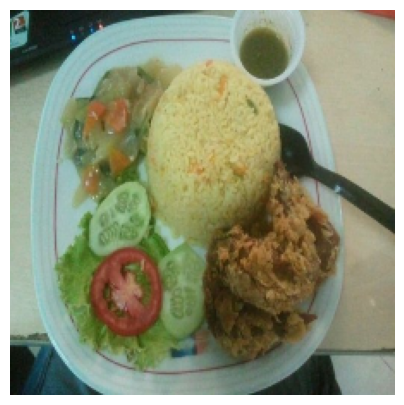

Actual Food    : fried_rice
Predicted Food : pulled_pork_sandwich
Confidence     : 39.76%


In [12]:
import numpy as np
import matplotlib.pyplot as plt

# Get one batch from validation dataset
images, labels = next(iter(validation_dataset))

# Select first image
image = images[0]
true_label = labels[0].numpy()

# Predict
prediction = model.predict(np.expand_dims(image, axis=0), verbose=0)

predicted_index = np.argmax(prediction)
confidence = np.max(prediction) * 100

# Display image
plt.figure(figsize=(5,5))
plt.imshow(image.numpy().astype("uint8"))
plt.axis("off")
plt.show()

print("Actual Food    :", class_names[true_label])
print("Predicted Food :", class_names[predicted_index])
print(f"Confidence     : {confidence:.2f}%")

C:\Users\spavi\AppData\Local\Temp\ipykernel_1128\563227495.py:35: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\spavi\AppData\Local\Temp\ipykernel_1128\563227495.py:35: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
c:\Users\spavi\ICBT CAMPUS FOLDER\AI-Based-Food-Recognition-System\backend\venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\spavi\ICBT CAMPUS FOLDER\AI-Based-Food-Recognition-System\backend\venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


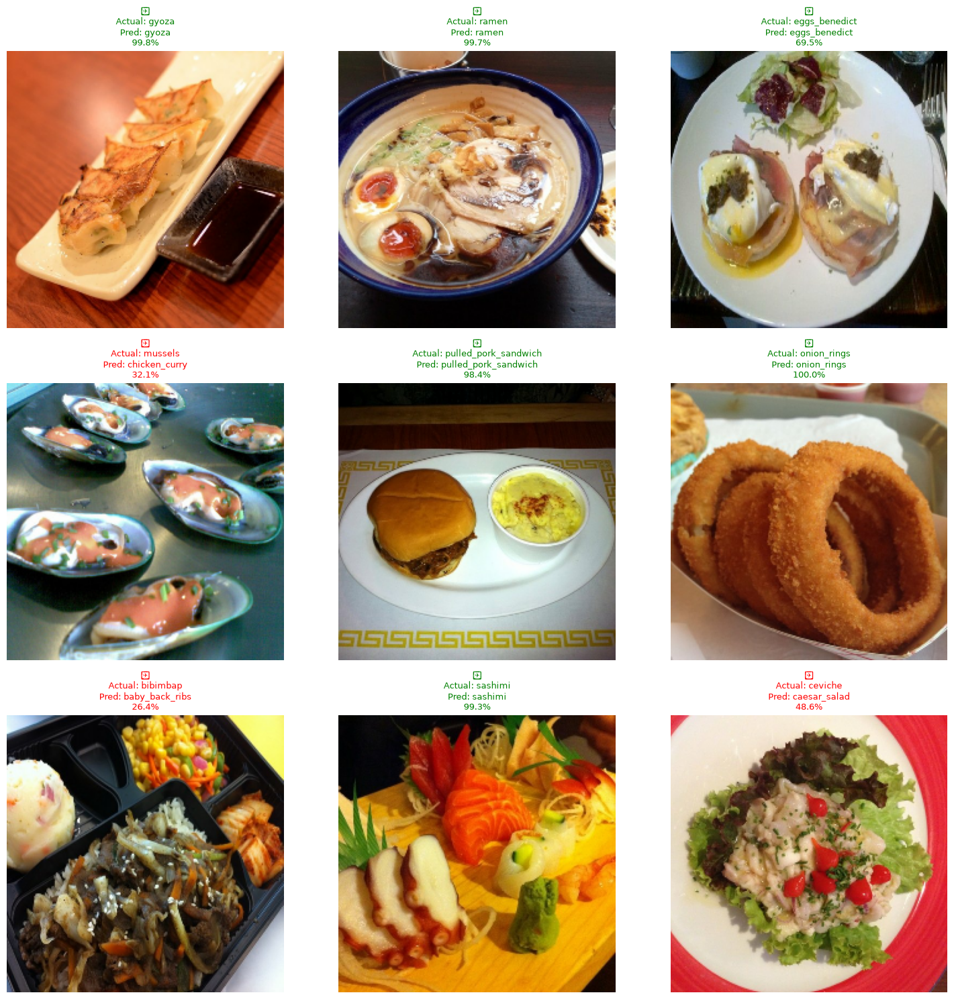

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import random

images, labels = next(iter(validation_dataset))

plt.figure(figsize=(15, 15))

for i in range(9):
    image = images[i]
    true_label = labels[i].numpy()

    prediction = model.predict(np.expand_dims(image, axis=0), verbose=0)

    predicted_index = np.argmax(prediction)
    confidence = np.max(prediction) * 100

    plt.subplot(3, 3, i + 1)
    plt.imshow(image.numpy().astype("uint8"))
    plt.axis("off")

    if predicted_index == true_label:
        color = "green"
        status = "✅"
    else:
        color = "red"
        status = "❌"

    plt.title(
        f"{status}\nActual: {class_names[true_label]}\nPred: {class_names[predicted_index]}\n{confidence:.1f}%",
        color=color,
        fontsize=9
    )

plt.tight_layout()
plt.show()

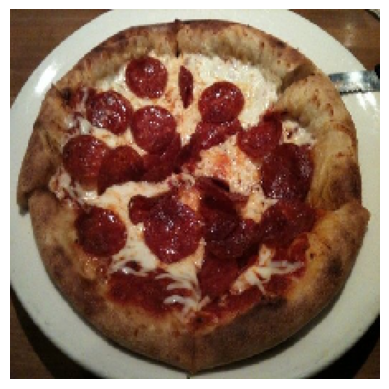

Predicted Food : pizza
Confidence : 99.97%


In [14]:
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

image_path = r"C:\Users\spavi\ICBT CAMPUS FOLDER\AI-Based-Food-Recognition-System\datasets\food-101\images\pizza\22489.jpg"

img = image.load_img(image_path, target_size=(224,224))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)

prediction = model.predict(img_array, verbose=0)

predicted_index = np.argmax(prediction)
confidence = np.max(prediction) * 100

plt.imshow(img)
plt.axis("off")
plt.show()

print("Predicted Food :", class_names[predicted_index])
print(f"Confidence : {confidence:.2f}%")

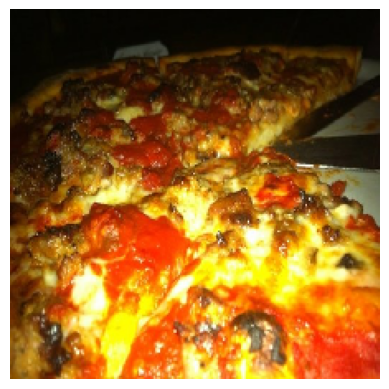

Predicted Food : pizza
Confidence : 97.81%


In [15]:
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

image_path = r"C:\Users\spavi\ICBT CAMPUS FOLDER\AI-Based-Food-Recognition-System\datasets\food-101\images\pizza\248199.jpg"

img = image.load_img(image_path, target_size=(224,224))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)

prediction = model.predict(img_array, verbose=0)

predicted_index = np.argmax(prediction)
confidence = np.max(prediction) * 100

plt.imshow(img)
plt.axis("off")
plt.show()

print("Predicted Food :", class_names[predicted_index])
print(f"Confidence : {confidence:.2f}%")

In [16]:
pizza_folder = r"C:\Users\spavi\ICBT CAMPUS FOLDER\AI-Based-Food-Recognition-System\datasets\food-101\images\pizza"

C:\Users\spavi\AppData\Local\Temp\ipykernel_1128\2071157830.py:41: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\spavi\AppData\Local\Temp\ipykernel_1128\2071157830.py:41: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


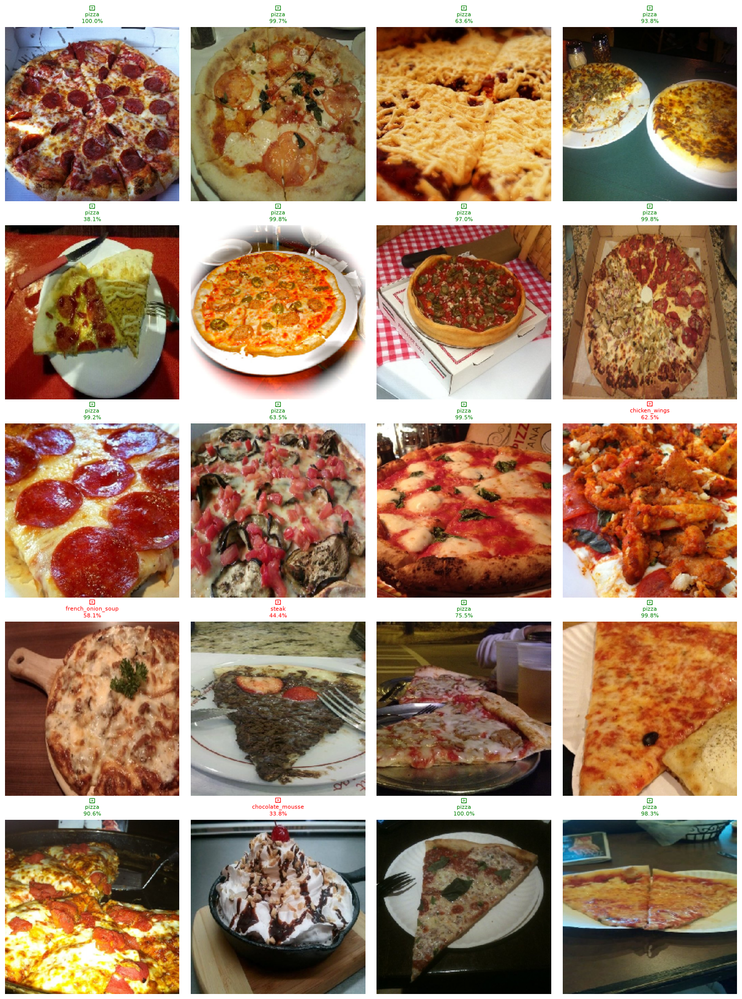

Pizza Testing Summary
Total Images : 20
Correct      : 16
Incorrect    : 4
Accuracy     : 80.00%


In [17]:
correct = 0
wrong = 0

image_files = sorted(os.listdir(pizza_folder))[:20]

plt.figure(figsize=(15,20))

for i, file in enumerate(image_files):

    img_path = os.path.join(pizza_folder, file)

    img = image.load_img(img_path, target_size=(224,224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)

    prediction = model.predict(img_array, verbose=0)

    predicted_index = np.argmax(prediction)
    confidence = np.max(prediction)*100

    predicted_food = class_names[predicted_index]

    if predicted_food == "pizza":
        correct += 1
        color = "green"
        symbol = "✅"
    else:
        wrong += 1
        color = "red"
        symbol = "❌"

    plt.subplot(5,4,i+1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(
        f"{symbol}\n{predicted_food}\n{confidence:.1f}%",
        fontsize=8,
        color=color
    )

plt.tight_layout()
plt.show()

print("="*50)
print("Pizza Testing Summary")
print("="*50)

print("Total Images :", len(image_files))
print("Correct      :", correct)
print("Incorrect    :", wrong)
print(f"Accuracy     : {(correct/len(image_files))*100:.2f}%")

In [18]:
hamburger_folder = r"C:\Users\spavi\ICBT CAMPUS FOLDER\AI-Based-Food-Recognition-System\datasets\food-101\images\hamburger"

C:\Users\spavi\AppData\Local\Temp\ipykernel_1128\2585150897.py:41: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\spavi\AppData\Local\Temp\ipykernel_1128\2585150897.py:41: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


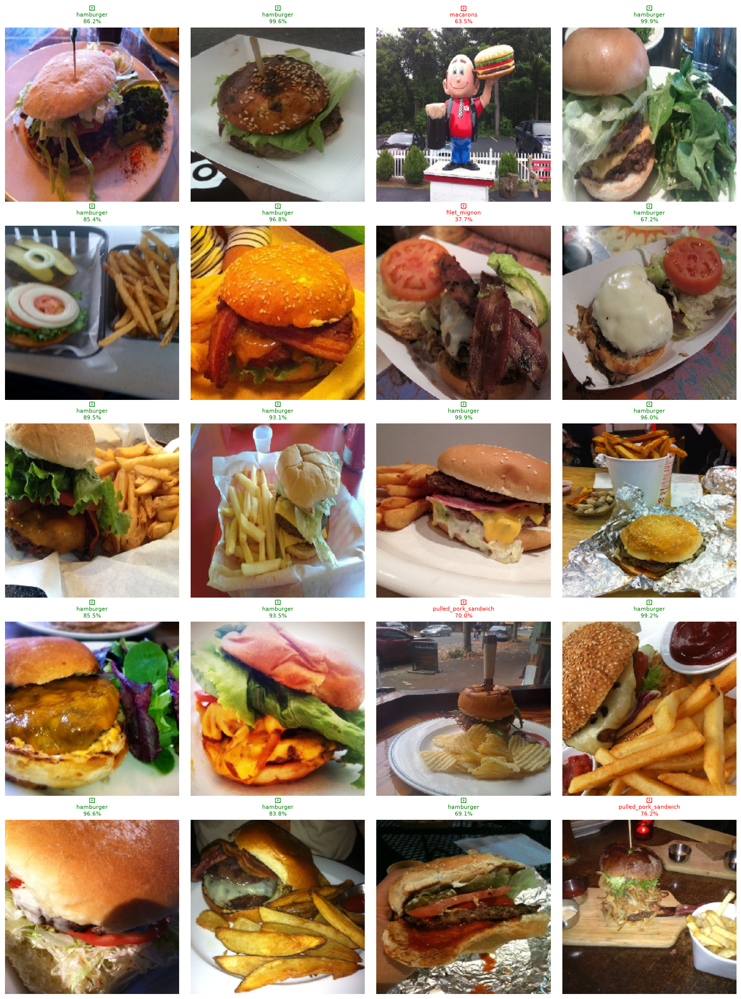

Hamburger Testing Summary
Total Images : 20
Correct      : 16
Incorrect    : 4
Accuracy     : 80.00%


In [19]:
correct = 0
wrong = 0

image_files = sorted(os.listdir(hamburger_folder))[:20]

plt.figure(figsize=(15,20))

for i, file in enumerate(image_files):

    img_path = os.path.join(hamburger_folder, file)

    img = image.load_img(img_path, target_size=(224,224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)

    prediction = model.predict(img_array, verbose=0)

    predicted_index = np.argmax(prediction)
    confidence = np.max(prediction) * 100

    predicted_food = class_names[predicted_index]

    if predicted_food == "hamburger":
        correct += 1
        color = "green"
        symbol = "✅"
    else:
        wrong += 1
        color = "red"
        symbol = "❌"

    plt.subplot(5, 4, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(
        f"{symbol}\n{predicted_food}\n{confidence:.1f}%",
        fontsize=8,
        color=color
    )

plt.tight_layout()
plt.show()

print("=" * 50)
print("Hamburger Testing Summary")
print("=" * 50)

print("Total Images :", len(image_files))
print("Correct      :", correct)
print("Incorrect    :", wrong)
print(f"Accuracy     : {(correct / len(image_files)) * 100:.2f}%")